In [1]:
import pandas as pd
import os
import re
import numpy as np
import pickle

import spacy
import re
nlp = spacy.load('it_core_news_sm')
#path = r'C:\Users\chiar\Documents\Università\Text analytics\Data'

path = r'D:\tirocinioLC\tirocinioLC'

modelname = path+'\doc2vec100.pkl'

In [2]:
df = pd.read_json(path+'\cleandf3.json')
df.Data = pd.to_datetime(df.Data)
df = df[df.Data.dt.year < 2019]
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37693 entries, 1 to 54718
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   ID                  37693 non-null  int64         
 1   Titolo_Rif          37690 non-null  object        
 2   Rating              37693 non-null  object        
 3   Nome_Autore         37693 non-null  object        
 4   Data                37693 non-null  datetime64[ns]
 5   Numero_Capitoli     37693 non-null  int64         
 6   Racconto_Text_Only  37693 non-null  object        
 7   N_Tot_Rec           37693 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(4)
memory usage: 2.6+ MB
None


,ID,Titolo_Rif,Rating,Nome_Autore,Data,Numero_Capitoli,Racconto_Text_Only,N_Tot_Rec
1,2909917,Rilassati! Hai tutta la morte davanti!,verde,Tonks98,2014-11-15,1,"""Zi zieda, prego. Allora, quale ezzere zuo ""B...",3
4,1390250,Episodi della Old Generation 1.,verde,mrsreg,2012-11-17,1,Introduzione. Personaggi: Argus Gazza:...,0
5,1143283,In Noctem,verde,LilacLilium,2012-04-07,1,Questo mio piccolo lavoretto è ispirato a una ...,2
7,917615,Dirty flower.,verde,Rue,2012-07-01,1,"DIRTY FLOWER. Lo hai sempre saputo, Lily. ...",3
8,917635,Hawthorn and Unicorn Air,giallo,Tonna,2012-08-01,1,Before you read: Bentro...,4


Format Data

In [3]:
from gensim.utils import simple_preprocess
from gensim.models.doc2vec import TaggedDocument
data = list()
for i, row in df.iterrows():
    data.append(TaggedDocument(words=simple_preprocess(row['Racconto_Text_Only']), 
                                 tags=[row['Nome_Autore']]))
data

[TaggedDocument(words=['zi', 'zieda', 'prego', 'allora', 'quale', 'ezzere', 'zuo', 'beh', 'io', 'ecco', 'veramente', 'non', 'lo', 'so', 'infatti', 'mi', 'aspettavo', 'di', 'finire', 'in', 'ben', 'altro', 'luogo', 'nien', 'io', 'intendefo', 'qvi', 'nel', 'senso', 'di', 'qvi', 'in', 'mio', 'studio', 'profezzore', 'ecco', 'si', 'era', 'fatto', 'fregare', 'stupidi', 'trucchetti', 'da', 'psicanalisti', 'certo', 'che', 'lo', 'so', 'silente', 'il', 'nostro', 'quanto', 'pare', 'amico', 'comune', 'mi', 'ha', 'obbligato', 'venire', 'qui', 'parlare', 'con', 'lei', 'ha', 'detto', 'che', 'mi', 'avrebbe', 'fatto', 'bene', 'rispose', 'con', 'un', 'moto', 'di', 'disprezzo', 'nella', 'voce', 'una', 'scrollata', 'di', 'spalle', 'non', 'penza', 'che', 'potrebbe', 'afere', 'ragione', 'assolutamente', 'no', 'che', 'diamine', 'già', 'sono', 'morto', 'lui', 'non', 'vuole', 'capire', 'che', 'voglio', 'essere', 'solo', 'semplicemente', 'lasciato', 'in', 'pace', 'questa', 'unica', 'cosa', 'che', 'potrebbe', 'fa

In [4]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

## Train Doc2vec

In [5]:
from gensim.models import Doc2Vec
#model = Doc2Vec(data, size=100, window=10, min_count=5)
#model = Doc2Vec(data, vector_size=100, window=10, min_count=100)

In [6]:
#with open(modelname,'wb') as outfile:
#    pickle.dump(model, outfile)

In [7]:
with open(modelname, 'rb') as infile:
    model = pickle.load(infile)

## Check word embeddings

In [8]:
model.wv.most_similar(['expelliarmus'])[:5]

[('protego', 0.8608884215354919),
 ('stupeficium', 0.769189178943634),
 ('totalus', 0.7515153884887695),
 ('sectumsempra', 0.7311954498291016),
 ('petrificus', 0.7172043919563293)]

In [9]:
model.wv.most_similar(['ippogrifo'])[:5]

[('animale', 0.7502808570861816),
 ('uccello', 0.7198182344436646),
 ('orso', 0.6987901926040649),
 ('animaletto', 0.6644068360328674),
 ('uccellino', 0.6509023904800415)]

In [10]:
model.wv.most_similar(['boccino'])

[('cercatore', 0.6987549066543579),
 ('bolide', 0.6405891180038452),
 ('volo', 0.6018887758255005),
 ('portiere', 0.5904898643493652),
 ('pluffa', 0.5778499841690063),
 ('manico', 0.5577322244644165),
 ('campionato', 0.5376320481300354),
 ('culo', 0.5372231006622314),
 ('ragazzo', 0.5227257013320923),
 ('braccialetto', 0.5204286575317383)]

In [11]:
model.wv.most_similar(['sirius'])

[('remus', 0.8224372267723083),
 ('padfoot', 0.796167254447937),
 ('peter', 0.7902251482009888),
 ('james', 0.7662600874900818),
 ('prongs', 0.7520052194595337),
 ('moony', 0.7451759576797485),
 ('felpato', 0.7418286800384521),
 ('ramoso', 0.740315318107605),
 ('regulus', 0.71883624792099),
 ('marlene', 0.6927083134651184)]

In [12]:
model.wv.most_similar(['harry'])

[('ron', 0.6509568095207214),
 ('hermione', 0.6161662936210632),
 ('ginny', 0.5755228996276855),
 ('hagrid', 0.5266100764274597),
 ('draco', 0.48489922285079956),
 ('neville', 0.45016515254974365),
 ('dobby', 0.4463112950325012),
 ('herm', 0.4446046054363251),
 ('potty', 0.4288393259048462),
 ('doni', 0.4231899380683899)]

In [13]:
model.wv.most_similar(['piton'])

[('snape', 0.8386747241020203),
 ('severus', 0.7968490123748779),
 ('lumacorno', 0.7429172992706299),
 ('raptor', 0.6825178265571594),
 ('vitious', 0.6802722215652466),
 ('vitius', 0.6643571257591248),
 ('rüf', 0.6548293232917786),
 ('silente', 0.6417749524116516),
 ('ruf', 0.6265837550163269),
 ('dumbledore', 0.6146697998046875)]

In [14]:
model.wv.most_similar(['bacchetta'])

[('pistola', 0.6801366806030273),
 ('maledizione', 0.5915833711624146),
 ('frusta', 0.5808752179145813),
 ('arma', 0.5808043479919434),
 ('borsetta', 0.5798643827438354),
 ('lanterna', 0.5739690065383911),
 ('scarpa', 0.5662012100219727),
 ('spada', 0.5574603080749512),
 ('valigia', 0.5447223782539368),
 ('lampada', 0.5375756621360779)]

In [15]:
model.wv.most_similar(['minerva'])

[('pomona', 0.7159234881401062),
 ('sibilla', 0.7121298313140869),
 ('professoressa', 0.6432478427886963),
 ('dolores', 0.6430219411849976),
 ('filius', 0.642099916934967),
 ('eileen', 0.611725926399231),
 ('horace', 0.6059417724609375),
 ('poppy', 0.5834875702857971),
 ('silente', 0.5774593353271484),
 ('amelia', 0.5692152976989746)]

In [16]:
model.wv.most_similar(['silente'])

[('dumbledore', 0.8735084533691406),
 ('vitious', 0.6587519645690918),
 ('raptor', 0.6545950174331665),
 ('grindelwald', 0.64583820104599),
 ('piton', 0.6417750120162964),
 ('aberforth', 0.6359100937843323),
 ('preside', 0.6301304697990417),
 ('percival', 0.6295381784439087),
 ('brian', 0.6112541556358337),
 ('rüf', 0.6087341904640198)]

In [17]:
model.wv.most_similar(['pietra'])

[('roccia', 0.7454966306686401),
 ('lastra', 0.6585930585861206),
 ('superficie', 0.6357482671737671),
 ('lapide', 0.6151207685470581),
 ('parete', 0.608045756816864),
 ('ghiaia', 0.6055677533149719),
 ('tomba', 0.5976747274398804),
 ('bara', 0.5966459512710571),
 ('statua', 0.5863634347915649),
 ('scogliera', 0.5833443999290466)]

In [18]:
model.wv.most_similar(['cercatore'])

[('portiere', 0.8106848001480103),
 ('capitano', 0.7554727792739868),
 ('campione', 0.7424283623695374),
 ('giocatore', 0.723686695098877),
 ('cacciatore', 0.7008039951324463),
 ('battitore', 0.700182318687439),
 ('boccino', 0.6987549066543579),
 ('quiddich', 0.6869207620620728),
 ('campionato', 0.6857951879501343),
 ('quidditch', 0.6717712879180908)]

In [19]:
model.wv.most_similar(['giocatore'])

[('campione', 0.7667900919914246),
 ('cercatore', 0.723686695098877),
 ('portiere', 0.7163710594177246),
 ('giocatrice', 0.6974762678146362),
 ('professionista', 0.6796587705612183),
 ('quiddich', 0.6473969221115112),
 ('allenamento', 0.6365227103233337),
 ('campionato', 0.6261968016624451),
 ('battitore', 0.6195555925369263),
 ('quidditch', 0.6133013963699341)]

In [20]:
model.wv.most_similar(['polisucco'])

[('antilupo', 0.7225285172462463),
 ('veritaserum', 0.6066688895225525),
 ('felicis', 0.588074803352356),
 ('felix', 0.5798627734184265),
 ('antidoto', 0.5615023970603943),
 ('anti', 0.554661750793457),
 ('illegale', 0.5236079096794128),
 ('permanente', 0.5057500600814819),
 ('pozione', 0.5036104321479797),
 ('lumache', 0.4819449484348297)]

In [21]:
model.wv.most_similar(['calderone'])

[('contenitore', 0.7547329664230347),
 ('laboratorio', 0.7139229774475098),
 ('cucchiaio', 0.6970864534378052),
 ('mestolo', 0.6915016174316406),
 ('lavello', 0.6909667253494263),
 ('bollitore', 0.68900465965271),
 ('banco', 0.6880638599395752),
 ('forno', 0.6854188442230225),
 ('bacile', 0.6827383041381836),
 ('barattolo', 0.6770602464675903)]

In [22]:
model.wv.most_similar(['pozione'])

[('boccetta', 0.7263222932815552),
 ('fiala', 0.724653959274292),
 ('bevanda', 0.6656975746154785),
 ('preparazione', 0.648993968963623),
 ('ciotola', 0.6433355212211609),
 ('pentola', 0.6335448026657104),
 ('tisana', 0.6260117292404175),
 ('sostanza', 0.6215399503707886),
 ('felix', 0.6175451278686523),
 ('lezione', 0.6125839948654175)]

## Check Doctags

In [23]:
model.docvecs.doctags

{'Tonks98': Doctag(offset=0, word_count=12522, doc_count=11),
 'mrsreg': Doctag(offset=1, word_count=12076, doc_count=21),
 'LilacLilium': Doctag(offset=2, word_count=5701, doc_count=4),
 'Rue': Doctag(offset=3, word_count=1209, doc_count=3),
 'Tonna': Doctag(offset=4, word_count=979, doc_count=1),
 'chi_lamed': Doctag(offset=5, word_count=35147, doc_count=20),
 'Pan_z': Doctag(offset=6, word_count=16883, doc_count=13),
 'Kiara': Doctag(offset=7, word_count=1349, doc_count=2),
 'Vale': Doctag(offset=8, word_count=3292, doc_count=1),
 'Myricae': Doctag(offset=9, word_count=2369, doc_count=4),
 'Hayley Black': Doctag(offset=10, word_count=50564, doc_count=53),
 'LadyDenebola': Doctag(offset=11, word_count=2739, doc_count=5),
 'minnow': Doctag(offset=12, word_count=3680, doc_count=2),
 'SeleneLightwood': Doctag(offset=13, word_count=22982, doc_count=25),
 'Elos': Doctag(offset=14, word_count=62364, doc_count=17),
 'darkrin': Doctag(offset=15, word_count=20302, doc_count=22),
 'sarina95': 

In [120]:
model.docvecs.most_similar("_MrsBlack_")

[('Sakura hime', 0.8968815207481384),
 ('Sennar28', 0.891345202922821),
 ('Madox', 0.8908266425132751),
 ('YoungRevolverOcelot', 0.8903250694274902),
 ('SerpeverdePH', 0.8884873390197754),
 ('MoonLollipop', 0.8871386051177979),
 ('The_Silver_Shadow', 0.8832947015762329),
 ('ChloesIvy', 0.8830130100250244),
 ('xandrina', 0.882313072681427),
 ('ErikaCullen', 0.8823081254959106)]

## Plot author similarity - create .js file

In [25]:
tags = list(model.docvecs.doctags)
tags[:5]

['Tonks98', 'mrsreg', 'LilacLilium', 'Rue', 'Tonna']

In [26]:
withfreq = []
for tag in tags:
    withfreq.append((model.docvecs.doctags[tag].doc_count, tag))

In [27]:
withfreq[:5]

[(11, 'Tonks98'), (21, 'mrsreg'), (4, 'LilacLilium'), (3, 'Rue'), (1, 'Tonna')]

In [28]:
withfreq.sort(reverse=True)
withfreq[:5]

[(117, 'Gaia Bessie'),
 (112, 'kamy'),
 (102, 'Writer96'),
 (100, 'Onlyna'),
 (100, 'Annette85')]

In [29]:
tags = list()
for _, tag in withfreq:
    tags.append(tag)
    if len(tags) >= 3000: #3000
        break
tags[:5]

['Gaia Bessie', 'kamy', 'Writer96', 'Onlyna', 'Annette85']

In [30]:
tagset = set(tags)
links = dict()
nodes = set()

In [31]:
for tag in tags:
    for simtag, dist in model.docvecs.most_similar(positive=[tag]):
        if dist > 0.80 and simtag in tagset: #0.80
            if not tag in links:
                links[tag] = list()
            links[tag].append(simtag)
            nodes.add(tag)
            nodes.add(simtag)

nodes = list(nodes)
nodetoidx = dict()
for i, tag in enumerate(nodes):
    nodetoidx[tag] = i

In [32]:
links

{'Writer96': ['Lils__L7'],
 'fri rapace': ['MrsTater', 'xela182', 'coshicoshi', 'Rowena'],
 'Slayer87': ['carmilla1324', 'Third Moon', 'Damia'],
 'MaryLouise': ['Charlotte McGonagall'],
 'Eliatheas': ['Bec Hale'],
 'lady hawke': ['Stormtroopers in stilettos'],
 'Cialy': ['Fireflie'],
 'fann1kaoriyuki': ['EmmaAlicia79'],
 'nals': ['Gray Winter'],
 'Ai_Sellie': ['Roxar', 'ale93'],
 'xela182': ['fri rapace'],
 'piperina': ['littledramy'],
 'Roxar': ['waferkya', 'guns_and_butter', 'Ai_Sellie', 'ale93'],
 'Charlotte McGonagall': ['MaryLouise'],
 'Rowena': ['menestrella 07', 'fri rapace'],
 'CottonBatu': ['Hermione Weasley', 'Nunki'],
 'Gray Winter': ['nals'],
 'Bec Hale': ['Eliatheas'],
 'thedragontosaphira': ['malfoymyheart'],
 'littledramy': ['piperina'],
 'ginny090': ['Puffola_Lilla', 'Nev_91'],
 'marilia': ['SweetGothicSoul'],
 'carmilla1324': ['Slayer87'],
 'malfoymyheart': ['thedragontosaphira'],
 'Sophie Hatter': ['Serpedoro'],
 'Akki_': ['LovelyMoon'],
 'crystalemi': ['Pudentilla Mc

In [33]:
#tenere quest'ordine
nodetoidx

{'marilia': 0,
 'Roxar': 1,
 'Damia': 2,
 'Puffola_Lilla': 3,
 'violet_w90': 4,
 'Zoey_': 5,
 'carolskilljoy': 6,
 'Neera': 7,
 'crystalemi': 8,
 '_FreeSoul_': 9,
 'ale93': 10,
 'roselline': 11,
 'Queen Scarlet': 12,
 'Nischino': 13,
 'Kafkaesque': 14,
 'ciokina': 15,
 'yayax': 16,
 'End less': 17,
 'Hermione Weasley': 18,
 'xela182': 19,
 'nals': 20,
 'furbacchina ': 21,
 'Cialy': 22,
 'xxsailorkikaxx': 23,
 'Charlotte McGonagall': 24,
 'Bec Hale': 25,
 'Annalisa_Ginny': 26,
 'lady hawke': 27,
 'Rowena': 28,
 'aliacciu': 29,
 '999': 30,
 'hug_': 31,
 'fivecarrotsx': 32,
 'Eliatheas': 33,
 'Phoenix00': 34,
 'cavallinobianco91': 35,
 'elisabiada': 36,
 'LovelyMoon': 37,
 'bemyronald': 38,
 'littledramy': 39,
 'guns_and_butter': 40,
 'JosephineWhite': 41,
 'Third Moon': 42,
 'ginny090': 43,
 '_amethyst_': 44,
 'Fireflie': 45,
 'Slayer87': 46,
 'Beliar': 47,
 'fri rapace': 48,
 'RAB 95': 49,
 'Gray Winter': 50,
 'Serpedoro': 51,
 'Moonlight': 52,
 'menestrella 07': 53,
 'babilapotter': 54

In [34]:
linkstonum = dict()
for author, link in links.items():
    linkstonum[nodetoidx[author]] = []
    for l in link:
        linkstonum[nodetoidx[author]].append(nodetoidx[l])
linkstonum

{102: [116],
 48: [105, 19, 103, 28],
 46: [64, 42, 2],
 62: [24],
 33: [25],
 27: [56],
 22: [45],
 86: [73],
 20: [50],
 57: [1, 10],
 19: [48],
 94: [39],
 1: [88, 40, 57, 10],
 24: [62],
 28: [53, 48],
 59: [18, 82],
 50: [20],
 25: [33],
 55: [87],
 39: [94],
 43: [3, 93],
 0: [111],
 64: [46],
 87: [55],
 83: [51],
 122: [37],
 8: [65],
 107: [47],
 42: [46],
 119: [13],
 13: [119],
 95: [90],
 68: [63],
 38: [108],
 51: [83],
 45: [22],
 88: [1, 40],
 101: [92],
 37: [122],
 18: [59],
 23: [29],
 29: [23],
 10: [1, 40, 57],
 82: [59],
 93: [3, 4, 43],
 63: [68],
 47: [107],
 103: [48],
 92: [101, 53],
 3: [93, 43, 4],
 65: [8],
 14: [117],
 2: [46],
 44: [99],
 26: [114],
 84: [112],
 117: [14],
 53: [28, 92],
 40: [1, 88, 10],
 111: [0],
 108: [38],
 61: [21],
 116: [102],
 96: [72],
 17: [58],
 4: [93, 3],
 32: [34],
 35: [54],
 54: [35],
 66: [15],
 77: [115],
 89: [36],
 60: [78, 98],
 105: [48],
 52: [30, 74, 81],
 41: [21],
 121: [109, 91],
 74: [81, 52, 30],
 76: [120],
 

In [35]:
with open (r'C:\Users\Andrea\Desktop\EmbeddingVisual\data.js', 'w', encoding='utf-8') as file:
    file.write('var nodes= [')
    for tag in nodes:
        file.write('{"name":"%s"},\n' % tag.replace('"', '\''))
    file.write(']\n')
    file.write('var links = [')
    for key in linkstonum:
        for target in linkstonum[key]:
            file.write('{ source: nodes[%i], target: nodes[%i]},\n' % (key, target))
    file.write(']\n')
    

## Explore author similarity

Compare full stories

In [121]:
model.docvecs.most_similar("_MrsBlack_")
#Allys - estar

[('Sakura hime', 0.8968815207481384),
 ('Sennar28', 0.891345202922821),
 ('Madox', 0.8908266425132751),
 ('YoungRevolverOcelot', 0.8903250694274902),
 ('SerpeverdePH', 0.8884873390197754),
 ('MoonLollipop', 0.8871386051177979),
 ('The_Silver_Shadow', 0.8832947015762329),
 ('ChloesIvy', 0.8830130100250244),
 ('xandrina', 0.882313072681427),
 ('ErikaCullen', 0.8823081254959106)]

In [122]:
df[df['Nome_Autore']=='_MrsBlack_']['Racconto_Text_Only'].values

array(['SEVERUS&SEVERUS  \xa0  \xa0  Albus Sevreus Potter camminava fiero lungo il corridoio del quinto piano.  \xa0  La cravatta verde argento si intonava perfettamente con i suoi occhi ereditati dal padre e la spilla da Prefetto spiccava sulla sua divisa.  \xa0  Con un gesto elegante alzò la manica sinistra per poter guardare l’ora: le lancette del suo nuovo orologio da polso segnavano le dieci precise.  \xa0  Albus allungò il passo per non arrivare tardi alla Sala delle Necessità, dove suo fratello maggiore aveva indetto la solita riunione di famiglia d’inizio anno.  \xa0  << Ehi tu! >>, una voce alle sue spalle lo fece fermare di colpo.  \xa0  << Chi ha parlato? >>, Albus alzò la voce notando che il corridoio era apparentamene deserto.  \xa0  << Ragazzo! >>, continuò la voce che lo aveva chiamato pochi attimi prima. << Sono qui! Nel quadro. >>  \xa0  Il giovane Serpeverde notò un quadro raffigurante i sotterranei e in primo piano un uomo dalla pelle chiara tendente al giallo che co

In [134]:
df[df['Nome_Autore']=='Sennar28']['Racconto_Text_Only'].values

array(['C’era ad illuminare la piccola stanzina solamente una candela. Mentre la cera lentamente gocciolava sul grezzo pavimento di mattoni, diffondeva quel poco di calore e di luce sul volto dei due ragazzi.  -Al-  -Dimmi-  -Allora ... che ne pensi?-  -Beh, per il bene superiore...- Rispose il giovane, seduto su un piccolo sgabello di legno, finemente intagliato a mano.  L’altro ragazzo, in piedi, cominciò a spolverare il cappello, poi guardò dritto in faccia l’amico, con un’ansia che cresceva sempre di più nel cuore del giovane. Voleva sentire soltanto una parola, con cui avrebbe accettato la sua proposta.  -Allora, Albus?-  -Direi ... direi che si può fare, Gellert. Si può fare-  Un ghigno apparve lievemente sul volto del giovane, il ragazzo in piedi. Gellert Grindelwald aveva trovato qualcuno con idee simili alle sue. Finalmente tutto poteva avere inizio.  Per il bene superiore.'],
      dtype=object)

Try wv.most_similar(vector)

In [39]:
author = "Allys"

In [40]:
#LilacLilium, Allys, Tonks98
model.wv.most_similar([model.docvecs[author]])

[('till', 0.6554552316665649),
 ('guess', 0.6072496175765991),
 ('talk', 0.5980521440505981),
 ('carry', 0.5917778611183167),
 ('though', 0.5875716209411621),
 ('empty', 0.5684539079666138),
 ('each', 0.5675179958343506),
 ('until', 0.5674514770507812),
 ('editor', 0.5673770904541016),
 ('dreaming', 0.565865159034729)]

In [41]:
word = 'guess'

In [42]:
for doc in df[df['Nome_Autore']==author]['Racconto_Text_Only']:
    #print(doc)
    if word in doc:
        #print(doc)
        print(True)
    else:
        print(False)

False


In [43]:
#check if word is in any of the similar authors' stories. Nearly always not!
for auth in model.docvecs.most_similar(author):
    print(auth)
    for doc in df[df['Nome_Autore']==auth[0]]['Racconto_Text_Only']:
        if word in doc:
            print(True)
        else:
            print(False)

('estar', 0.9112604856491089)
False
('MaryWeasley', 0.9074978828430176)
False
('Serpe89', 0.9073588252067566)
False
False
('snow96', 0.9044365286827087)
False
('giuliaHP4ever', 0.900248110294342)
False
('PowerOfLove', 0.8994623422622681)
False
('PurpleSky', 0.8978848457336426)
False
('Without_you', 0.8970686197280884)
False
('Only Chii', 0.8959862589836121)
False
('rachelesogna', 0.8955847024917603)
False


# Similarity Explainability - our approach

• Concatenate stories by their author to create a single document; <br>
• Tokenize and lemmatize them; <br>
• For each author, compute TD-IDF score for
each word, in order to get the most representative words for their document; <br>
• Take the top n words (10, in our case) of
each document and compare them to the
ones of the documents linked to it; <br>
• For each link, print and store the shared
representative words, if any.

In [45]:
#Concatena testi autori presenti nel grafo
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

def ext_df(dic, df):
    new_df = df[df['Nome_Autore'].isin(dic.keys())]
    new_df = new_df.groupby('Nome_Autore', sort=False)[["Racconto_Text_Only"]].sum()
    return new_df
#Tokenizza e lemmatizza 

def spacy_nlp_tokenizer(text):
    text = re.sub('\s+', ' ', text)
    text = word_tokenize(text)
    fullwords = [token for token in text if not token in stopwords.words('italian')]
    fulltext = ' '.join([str(elem) for elem in fullwords])
    #fullwords = fullwords.join(fullwords)
    doc = nlp(fulltext)
    lemmas = [token.lemma_ for token in doc if not token.is_stop]
    all_tokens = list()
    all_tokens.extend(lemmas)
    return all_tokens

In [46]:
def adjust_df(dic, df):
    #prendi testi
    new_df = ext_df(dic, df)
    #tokenizza e lemmatizza
    new_df['Racconto_Text_Only'] = new_df['Racconto_Text_Only'].apply(lambda x: spacy_nlp_tokenizer(x))
    return new_df


In [47]:
#mydf = adjust_df(links, df)

In [48]:
#with open(path+r'\newdf_doc2vec_tokenizzato.pkl', 'wb') as f:
#    pickle.dump(mydf, f)
with open(path+r'\newdf_doc2vec_tokenizzato.pkl', 'rb') as f:
    mydf = pickle.load(f)

In [49]:
mydf

,Racconto_Text_Only
Nome_Autore,
Writer96,"[guardare, ,, oltrepassare, sguardo, ., andare..."
Psy,"[dovere, ammettere, ’, idea, fict, nato, legge..."
marilia,"[averti, ......, ..., attimi, ........., momen..."
Hermione Weasley,"[ciao, !, !, !, sapere, ,, ', giù, ,, sapere, ..."
Neera,"[., ., uscire, assieme, ,, ., Harry, guaio, ,,..."
...,...
bemyronald,"[,, ., ,, dimenticare, ., “, stay, here, ,, ha..."
Puffola_Lilla,"[note, ., nota, scrivere, fondo, ,, volere, fa..."
Nev_91,"[semplicemente, neville, neville, camminare, i..."


In [50]:
def cleandf(mydf, col, newcol):
    mydf[newcol] = mydf[col].apply(lambda x: ' '.join(x))
    mydf[newcol].replace(r'\W', ' ', regex=True, inplace=True)
    mydf[newcol] = mydf[newcol].str.lower()
    #df.strings.str.replace('', '')
    #mydf[newcol].replace(r'MISC|LOC|PER|ORG', ' ', regex=True, inplace=True)
    return mydf

In [51]:
cleandf = cleandf(mydf, 'Racconto_Text_Only', 'Testo')

In [52]:
cleandf

,Racconto_Text_Only,Testo
Nome_Autore,,
Writer96,"[guardare, ,, oltrepassare, sguardo, ., andare...",guardare oltrepassare sguardo andare corni...
Psy,"[dovere, ammettere, ’, idea, fict, nato, legge...",dovere ammettere idea fict nato leggere libr...
marilia,"[averti, ......, ..., attimi, ........., momen...",averti attimi momento ...
Hermione Weasley,"[ciao, !, !, !, sapere, ,, ', giù, ,, sapere, ...",ciao sapere giù sapere quello se...
Neera,"[., ., uscire, assieme, ,, ., Harry, guaio, ,,...",uscire assieme harry guaio avverata ...
...,...,...
bemyronald,"[,, ., ,, dimenticare, ., “, stay, here, ,, ha...",dimenticare stay here have fear ...
Puffola_Lilla,"[note, ., nota, scrivere, fondo, ,, volere, fa...",note nota scrivere fondo volere fare saper...
Nev_91,"[semplicemente, neville, neville, camminare, i...",semplicemente neville neville camminare indiet...


In [54]:
#results

In [55]:
#with open(path+r'\tfidfresults.pkl', 'wb') as out:
#    pickle.dump(results, out)
with open(path+r'\tfidfresults.pkl', 'rb') as f:
    results = pickle.load(f)
results

{'Psy': {'lily': 0.01027013274854369,
  'james': 0.009763133475756991,
  'evans': 0.0045403528370834625,
  'sirius': 0.00424325251749318,
  'writ': 0.0036924460983576613,
  'petunia': 0.003328571504095209,
  'remus': 0.0032216789078681704,
  'alice': 0.0022202353296936076,
  'tac': 0.002173452441259939,
  'alana': 0.002137322724588792},
 'marilia': {'fict': 0.029992361252362966,
  'portavoce': 0.016166250850177942,
  'biasimato': 0.011996944500945187,
  'arrendermi': 0.008692847392168917,
  'centesimo': 0.007827638151712432,
  'godo': 0.007156529726707291,
  'arrendere': 0.0069520042256123816,
  'pretesto': 0.006608194217552541,
  'leggete': 0.0063674642696622055,
  'eleanor': 0.0059984722504725935},
 'Hermione Weasley': {'brunetta': 0.009212681665979956,
  'ron': 0.006508095519747442,
  'hermione': 0.0054830857127350155,
  'moro': 0.0036488193757582377,
  'sussurrare': 0.0030715777920303344,
  'herm': 0.002919631564516411,
  'annuì': 0.002707508292359821,
  'zia': 0.002270926460683232

In [56]:
names = cleandf.index
names

Index(['Writer96', 'Psy', 'marilia', 'Hermione Weasley', 'Neera', 'Slayer87',
       'Moonlight', 'Serpedoro', 'Nunki', 'CottonBatu',
       ...
       'Annalisa_Ginny', 'fcillow', 'ale93', 'bluemoon__', 'violet_w90',
       'bemyronald', 'Puffola_Lilla', 'Nev_91', 'Hximweh',
       'nenaismissinghermidy'],
      dtype='object', name='Nome_Autore', length=108)

In [57]:
results2 = {}
for i, x in enumerate(names):
    if i >= 107:
        break
    results2[x] = results[names[i+1]]
results2

{'Writer96': {'lily': 0.01027013274854369,
  'james': 0.009763133475756991,
  'evans': 0.0045403528370834625,
  'sirius': 0.00424325251749318,
  'writ': 0.0036924460983576613,
  'petunia': 0.003328571504095209,
  'remus': 0.0032216789078681704,
  'alice': 0.0022202353296936076,
  'tac': 0.002173452441259939,
  'alana': 0.002137322724588792},
 'Psy': {'fict': 0.029992361252362966,
  'portavoce': 0.016166250850177942,
  'biasimato': 0.011996944500945187,
  'arrendermi': 0.008692847392168917,
  'centesimo': 0.007827638151712432,
  'godo': 0.007156529726707291,
  'arrendere': 0.0069520042256123816,
  'pretesto': 0.006608194217552541,
  'leggete': 0.0063674642696622055,
  'eleanor': 0.0059984722504725935},
 'marilia': {'brunetta': 0.009212681665979956,
  'ron': 0.006508095519747442,
  'hermione': 0.0054830857127350155,
  'moro': 0.0036488193757582377,
  'sussurrare': 0.0030715777920303344,
  'herm': 0.002919631564516411,
  'annuì': 0.002707508292359821,
  'zia': 0.002270926460683232,
  'mar

In [58]:
def check_sim(results, links):
    out = {}
    for auth in links: #psy
        for link in links[auth]:
            try:
                matches = [word for word in results[auth].keys() if word in results[link].keys()]
            except:
                continue
            print('author1:', auth, ' - ', 'author2:', link)
            if len(matches) != 0:
                for match in matches:
                    if match not in out:
                        out[match] = 1
                    else:
                        out[match] +=1
                    print(match)
            else:
                print('XXXXXXXXXXXXXXXXX')
    return out

Shared top words (by TDIDF) between linked authors

In [59]:
explres = check_sim(results2, links)

author1: Writer96  -  author2: Lils__L7
lily
james
evans
author1: fri rapace  -  author2: MrsTater
remus
tonks
lupin
author1: fri rapace  -  author2: xela182
remus
tonks
lupin
author1: fri rapace  -  author2: coshicoshi
remus
tonks
teddy
ninfadora
andromeda
author1: fri rapace  -  author2: Rowena
remus
tonks
ninfadora
author1: Slayer87  -  author2: carmilla1324
draco
blaise
author1: Slayer87  -  author2: Third Moon
draco
author1: Slayer87  -  author2: Damia
draco
blaise
pansy
harry
author1: MaryLouise  -  author2: Charlotte McGonagall
minerva
albus
10
author1: Eliatheas  -  author2: Bec Hale
dominique
scorpius
rose
victoire
rosie
author1: lady hawke  -  author2: Stormtroopers in stilettos
sirius
author1: Cialy  -  author2: Fireflie
XXXXXXXXXXXXXXXXX
author1: fann1kaoriyuki  -  author2: EmmaAlicia79
draco
harry
moro
author1: nals  -  author2: Gray Winter
james
sirius
remus
author1: Ai_Sellie  -  author2: Roxar
remus
sirius
author1: Ai_Sellie  -  author2: ale93
remus
sirius
author1: xela

In [61]:
len(links)

108

In [62]:
explres

{'lily': 6,
 'james': 16,
 'evans': 2,
 'remus': 38,
 'tonks': 14,
 'lupin': 4,
 'teddy': 2,
 'ninfadora': 4,
 'andromeda': 2,
 'draco': 20,
 'blaise': 4,
 'pansy': 2,
 'harry': 10,
 'minerva': 2,
 'albus': 2,
 '10': 2,
 'dominique': 2,
 'scorpius': 2,
 'rose': 2,
 'victoire': 2,
 'rosie': 2,
 'sirius': 30,
 'moro': 4,
 'hermione': 18,
 'granger': 2,
 'malfoy': 2,
 'regulus': 6,
 'ted': 2,
 'ron': 18,
 'perchè': 2,
 'ginny': 10,
 'chiese': 4,
 'bill': 4,
 'fleur': 4,
 'michael': 2,
 'brunetta': 2,
 'sussurrare': 2,
 'herm': 4,
 'annuì': 2,
 'peter': 2,
 'rem': 2,
 'severus': 2,
 'non': 2,
 'licantropo': 2,
 'astoria': 2,
 'neville': 2,
 'hannah': 2,
 'baco': 11,
 'segnala': 11,
 'form': 11,
 'txt': 11,
 'provvedera': 11,
 'casella': 11,
 'stories': 11,
 'amministrazione': 11,
 'grassetto': 2}

In [63]:
string = ''
for key, value in explres.items():
    for n in range(value):
        string += key
        string += ' '
string

'lily lily lily lily lily lily james james james james james james james james james james james james james james james james evans evans remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus remus tonks tonks tonks tonks tonks tonks tonks tonks tonks tonks tonks tonks tonks tonks lupin lupin lupin lupin teddy teddy ninfadora ninfadora ninfadora ninfadora andromeda andromeda draco draco draco draco draco draco draco draco draco draco draco draco draco draco draco draco draco draco draco draco blaise blaise blaise blaise pansy pansy harry harry harry harry harry harry harry harry harry harry minerva minerva albus albus 10 10 dominique dominique scorpius scorpius rose rose victoire victoire rosie rosie sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius sirius si

### Plot a wordcloud

In [64]:
import numpy as np
import pandas as pd
from os import path
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt

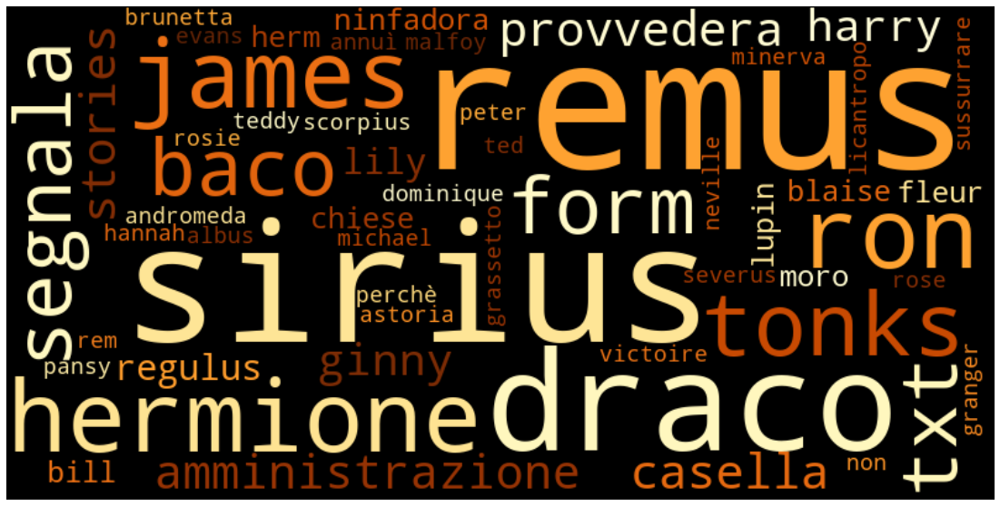

In [65]:
wordcloud = WordCloud(background_color="black", collocations=False, 
                      colormap='YlOrBr', max_font_size=150, min_font_size=1, 
                     width=800, height=400).generate(string)

# Display the generated image:

plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [66]:
#wordcloud.to_file(r"C:\Users\Andrea\Desktop\provacloud.png")